In [1]:
!pip install -U efficientnet

   ---------------------------------------- 0.0/50.7 kB ? eta -:--:--
   -------- ------------------------------- 10.2/50.7 kB ? eta -:--:--
   ------------------------ --------------- 30.7/50.7 kB 640.0 kB/s eta 0:00:01
   -------------------------------- ------- 41.0/50.7 kB 279.3 kB/s eta 0:00:01
   ---------------------------------------- 50.7/50.7 kB 257.7 kB/s eta 0:00:00


### Import Libraries

In [29]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.metrics import roc_curve,auc,classification_report,confusion_matrix
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import tensorflow.keras
import json
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dense,Flatten,Dropout  
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam,SGD,RMSprop,Adamax
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from efficientnet.keras import EfficientNetB3
from tensorflow.keras.applications import EfficientNetB3   
from random import shuffle
from tqdm import tqdm  
import scipy
import skimage
from skimage.transform import resize
import random
import os

In [30]:
df = pd.read_csv(r"C:\Users\HP\Downloads\AI PROJECTS\Pretrained Model\PM 3\cassava-leaf-disease-classification_train.csv")
df.head(5)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


So, lets map the label number to actual names i.e., disease types

In [31]:
with open(r"C:\Users\HP\Downloads\AI PROJECTS\Pretrained Model\PM 3\label_num_to_disease_map.json") as f:
    mapping = json.loads(f.read())
    print(mapping)

{'0': 'Cassava Bacterial Blight (CBB)', '1': 'Cassava Brown Streak Disease (CBSD)', '2': 'Cassava Green Mottle (CGM)', '3': 'Cassava Mosaic Disease (CMD)', '4': 'Healthy'}


### Target Distribution


In [32]:
df['label'].value_counts()

label
3    13158
4     2577
2     2386
1     2189
0     1087
Name: count, dtype: int64

There is a huge class imbalance and in it Cassava Mosaic Disease has majority of samples which is more than 6 times to other diseases.

### Visualize Disease Types

In [33]:
def visualize(img_list):
    rows = 3
    cols = 3

    plt.figure(figsize=(18, 10))

    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        r = np.random.randint(len(img_list))
        img_path = os.path.join(r"C:\Users\HP\Downloads\AI PROJECTS\Pretrained Model\PM 3\train_images", str(img_list[r]))
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.xticks([])
        plt.yticks([])
        plt.title(str(img_list[r]))
        plt.imshow(img)

    plt.tight_layout()
    plt.show()


### Class 0 : Cassava Bacterial Blight (CBB)

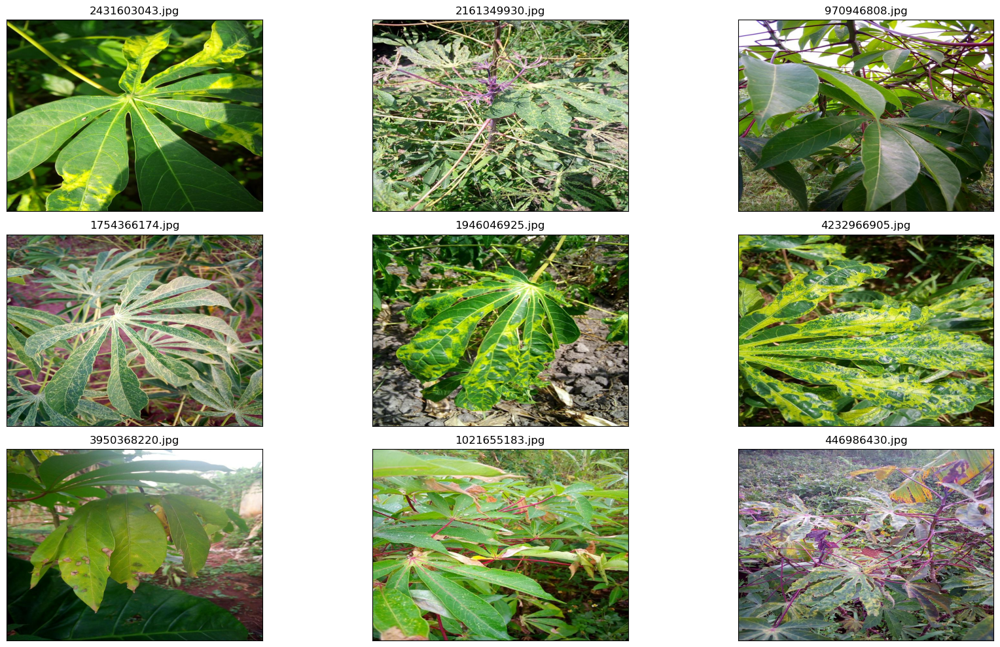

In [34]:
cbb_df = df[df['label'].isin([0])]
cbb_img_list = list(df['image_id'])

visualize(cbb_img_list)

### Class 1 : Cassava Brown Streak Disease (CBSD)

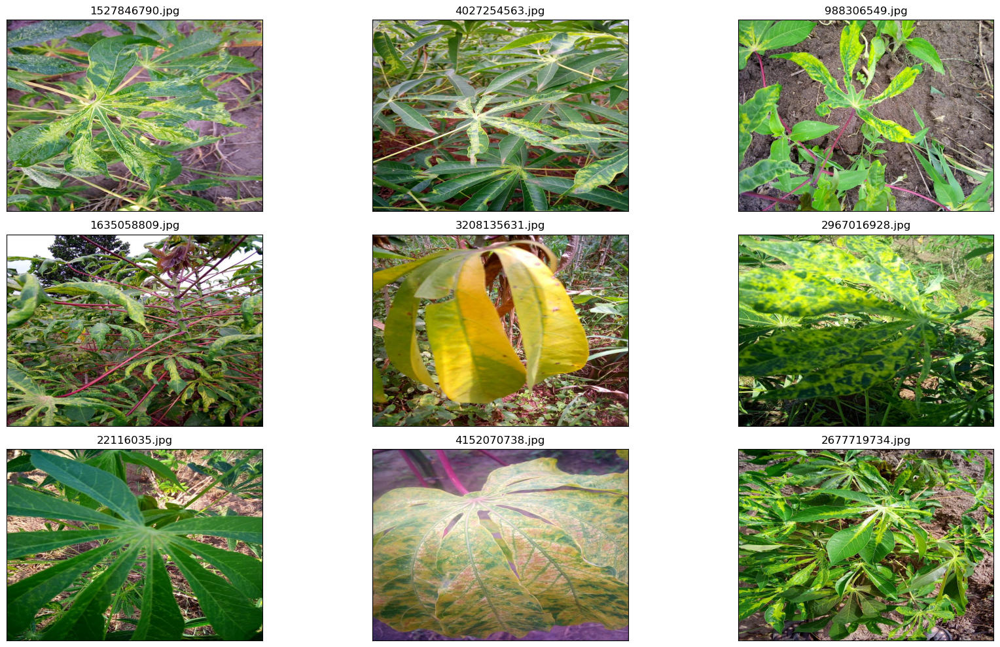

In [35]:
cbb_df = df[df['label'].isin([1])]
cbb_img_list = list(df['image_id'])

visualize(cbb_img_list)

### Class 2 : Cassava Green Mottle (CGM)

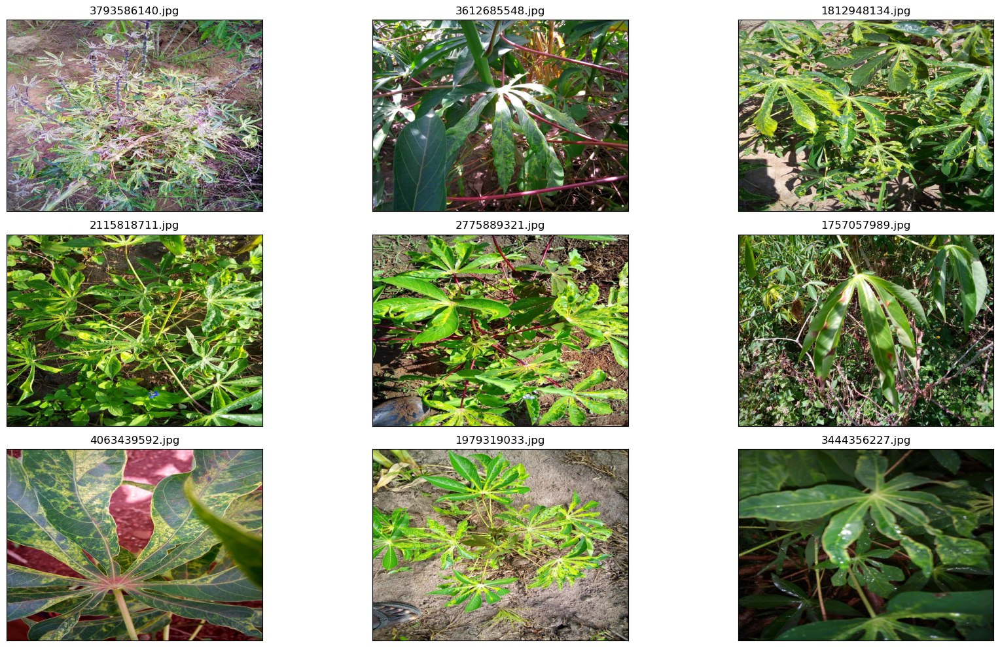

In [36]:
cbb_df = df[df['label'].isin([2])]
cbb_img_list = list(df['image_id'])

visualize(cbb_img_list)

### Class 3 : Cassava Mosiac Disease (CMD)

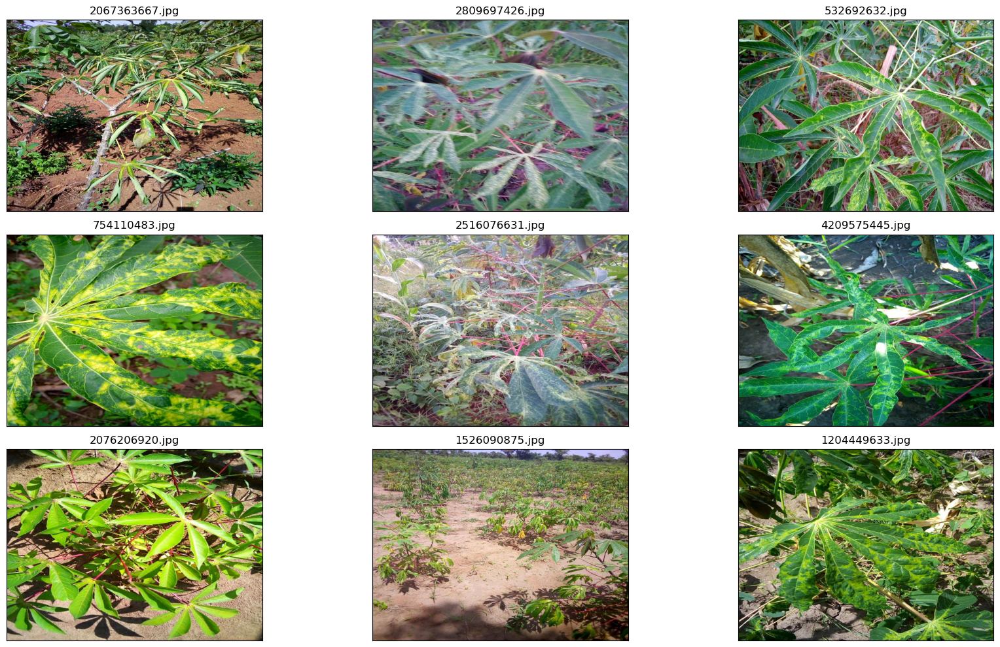

In [37]:
cbb_df = df[df['label'].isin([3])]
cbb_img_list = list(df['image_id'])

visualize(cbb_img_list)

### Class 4 : Healthy Leaves

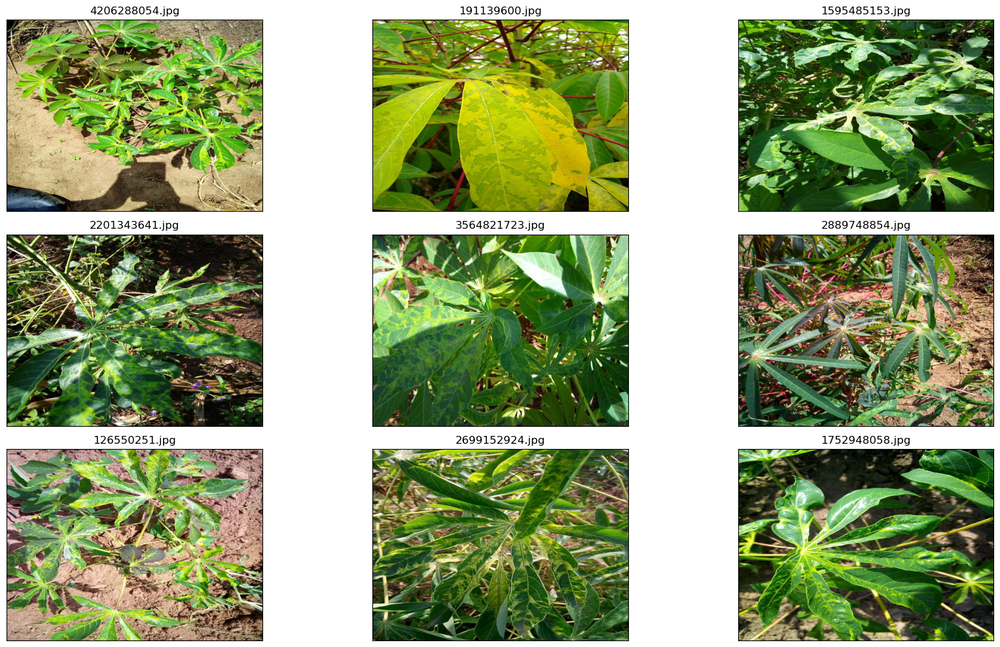

In [38]:
cbb_df = df[df['label'].isin([4])]
cbb_img_list = list(df['image_id'])

visualize(cbb_img_list)

### Defining Hyperparameters

In [39]:
BATCH_SIZE = 16
TARGET_SIZE = 224
BASE_DIR = "C:/Users/HP/Downloads/AI PROJECTS/Pretrained Model/PM 3/"
EPOCHS = 10

### Image Pre-processing

In [40]:
def preprocess(image):
    #Converting to numpy array from numpy tensor with rank 3
    image = np.array(image, dtype=np.uint8)
    #Gaussian Blur
    gaussian_blur = cv2.GaussianBlur(image,(5,5),0)
    img = np.asarray(gaussian_blur, dtype=np.float64)
    return img

In [41]:
#Converting labels to string to use sparse class mode
df.label = df.label.astype('str')

### Data Augmentation

In [42]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#Training  Augumentation
datagen = ImageDataGenerator(rescale=1.0/255,
                             featurewise_center=True,
                             featurewise_std_normalization=True,
                             rotation_range=30,
                             width_shift_range=0.3,
                             height_shift_range=0.3,
                             shear_range=15.0,
                             zoom_range=0.2,
                             horizontal_flip=True,
                             brightness_range=[0.2, 0.8],
                             validation_split=0.2,
                             fill_mode='nearest',
                             preprocessing_function=preprocess)


train_datagen = datagen.flow_from_dataframe(df,
                                            directory = os.path.join(BASE_DIR, "train_images"),
                                            subset = "training",
                                            x_col = "image_id",
                                            y_col = "label",
                                            target_size = (TARGET_SIZE, TARGET_SIZE),
                                            batch_size = BATCH_SIZE,
                                            class_mode = "sparse")

#Validation
validation_datagen = ImageDataGenerator(rescale=1.0/255,
                                        validation_split=0.2,
                                       preprocessing_function=preprocess)


valid_datagen = validation_datagen.flow_from_dataframe(df,
                                            directory = os.path.join(BASE_DIR, "train_images"),
                                            subset = "validation",
                                            x_col = "image_id",
                                            y_col = "label",
                                            target_size = (TARGET_SIZE, TARGET_SIZE),
                                            batch_size = BATCH_SIZE,
                                            class_mode = "sparse")

Found 17118 validated image filenames belonging to 5 classes.
Found 4279 validated image filenames belonging to 5 classes.


## Defining Model

In [43]:
#He Uniform Initializer for Dense Layer
import tensorflow as tf
def my_init(shape, dtype=None):
    initializer = tf.keras.initializers.he_uniform(seed = 1)
    return initializer(shape, dtype=dtype)


In [44]:
base_model = EfficientNetB3(weights = 'imagenet', include_top=False, input_shape = (TARGET_SIZE, TARGET_SIZE, 3), pooling=None)

base_output = base_model.output
pooling_layer = layers.GlobalAveragePooling2D()(base_output)
Dense1 = layers.Dense(256, activation = "relu", kernel_initializer=my_init)(pooling_layer)
BN1 = layers.BatchNormalization()(Dense1)
dropout = layers.Dropout(0.2)(BN1)
model = layers.Dense(5, activation="softmax")(dropout)

model = models.Model(base_model.input, model)

model.compile(optimizer = 'adam', 
              loss = "sparse_categorical_crossentropy", 
              metrics=["acc"])
model.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        960 │ block1a_se_excit

 Total params: 11,179,316 (42.65 MB)

 Trainable params: 11,091,501 (42.31 MB)

 Non-trainable params: 87,815 (343.03 KB)

In [45]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
filepath = "model.keras"  # Change the extension

callbacks = [
    ReduceLROnPlateau(monitor='val_loss', patience=1, verbose=1, factor=0.1),
    EarlyStopping(monitor='val_loss', patience=2),
    ModelCheckpoint(filepath=filepath, monitor='val_loss', save_best_only=True)
]


In [46]:
history = model.fit(
    train_datagen,
    epochs=EPOCHS,
    validation_data=valid_datagen,
    callbacks=callbacks
)


c:\Users\HP\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:1263: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(
c:\Users\HP\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:1273: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn(


Epoch 1/10


c:\Users\HP\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1070/1070 ━━━━━━━━━━━━━━━━━━━━ 9255s 9s/step - acc: 0.5964 - loss: 1.2916 - val_acc: 0.7556 - val_loss: 0.7354 - learning_rate: 0.0010
Epoch 2/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - acc: 0.7321 - loss: 0.7447
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 7239s 7s/step - acc: 0.7321 - loss: 0.7447 - val_acc: 0.7481 - val_loss: 1.0048 - learning_rate: 0.0010
Epoch 3/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 7343s 7s/step - acc: 0.7664 - loss: 0.6477 - val_acc: 0.8095 - val_loss: 0.5303 - learning_rate: 1.0000e-04
Epoch 4/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - acc: 0.7919 - loss: 0.5890
Epoch 4: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 7929s 7s/step - acc: 0.7919 - loss: 0.5890 - val_acc: 0.7873 - val_loss: 0.5768 - learning_rate: 1.0000e-04
Epoch 5/10
1070/1070 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - acc: 0.8043 - loss: 0.5526
Epoch 5: ReduceLROnPlateau reducing learn

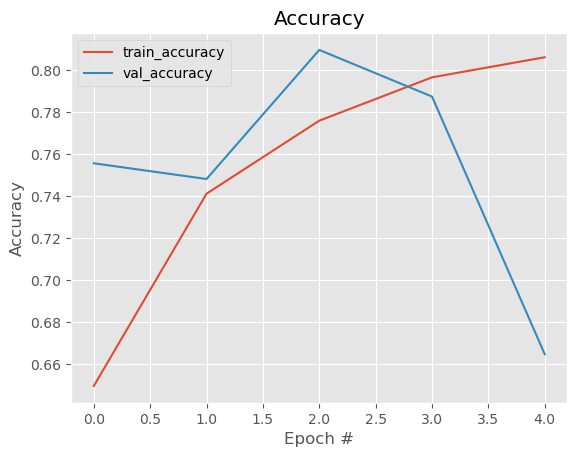

In [49]:
plt.style.use("ggplot")
plt.figure()
N = len(history.history["acc"])  # dynamically get number of epochs

plt.plot(np.arange(0, N), history.history["acc"], label="train_accuracy")
plt.plot(np.arange(0, N), history.history["val_acc"], label="val_accuracy")

plt.title("Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Accuracy")
plt.legend(loc="upper left")
plt.show()


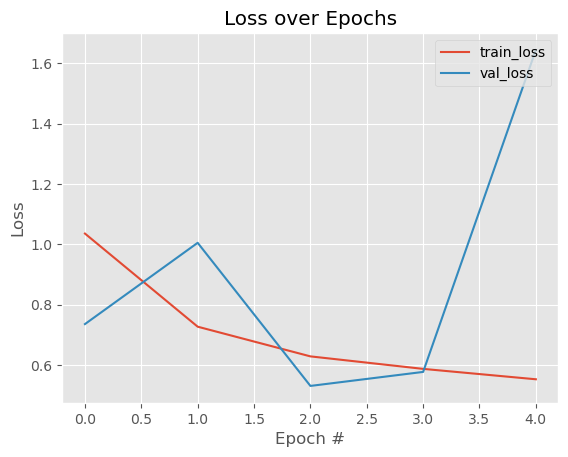

In [51]:
plt.style.use("ggplot")
plt.figure()

# Dynamically set N to match the number of epochs in history
N = len(history.history["loss"])

# Plot training and validation loss
plt.plot(np.arange(0, N), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), history.history["val_loss"], label="val_loss")

plt.title("Loss over Epochs")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="upper right")
plt.show()


### Model Inspection 

In this step we have visualized the activation layers of the model

In [62]:
# Extract outputs from all layers or a selected subset
layer_outputs = [layer.output for layer in model.layers[1:15]]  # or model.layers for all layers
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Path to your test rose image
test_image = r"C:\Users\HP\Downloads\AI PROJECTS\Pretrained Model\PM 3\Roses\Yellow Rose (6).jpg"

In [63]:

# Read and preprocess the image
image = cv2.imread(test_image)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Fix color channel order
image_pil = Image.fromarray(image)
resized_image = image_pil.resize((224, 224))  # ResNet or VGG size
image_array = np.array(resized_image).astype('float32') / 255.0
input_batch = np.expand_dims(image_array, axis=0)  # Add batch dimension

# Predict activations
activations = activation_model.predict(input_batch)

 


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step


In [64]:
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    num_features = activation.shape[-1]
    activation_index = 0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*4.5, col_size*2.5))
    
    for row in range(row_size):
        for col in range(col_size):
            if activation_index < num_features:
                ax[row][col].imshow(activation[0, :, :, activation_index], cmap='gray')
                ax[row][col].axis('off')
                activation_index += 1
            else:
                ax[row][col].axis('off')
    plt.tight_layout()
    plt.show()


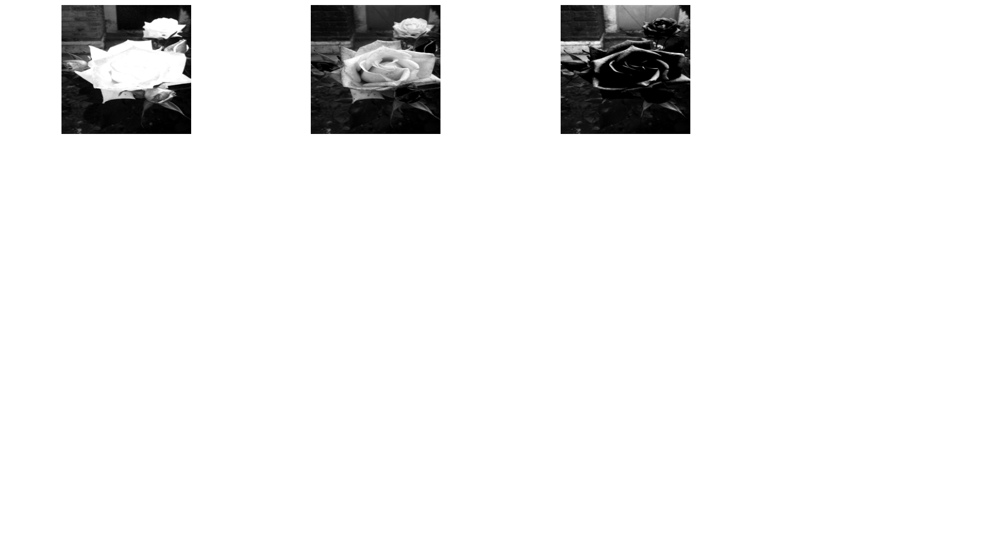

In [65]:
# Display first 16 filters from the 3rd layer (index 2)
display_activation(activations, col_size=4, row_size=4, act_index=2)

# Or from 5th layer
#display_activation(activations, col_size=4, row_size=4, act_index=4)


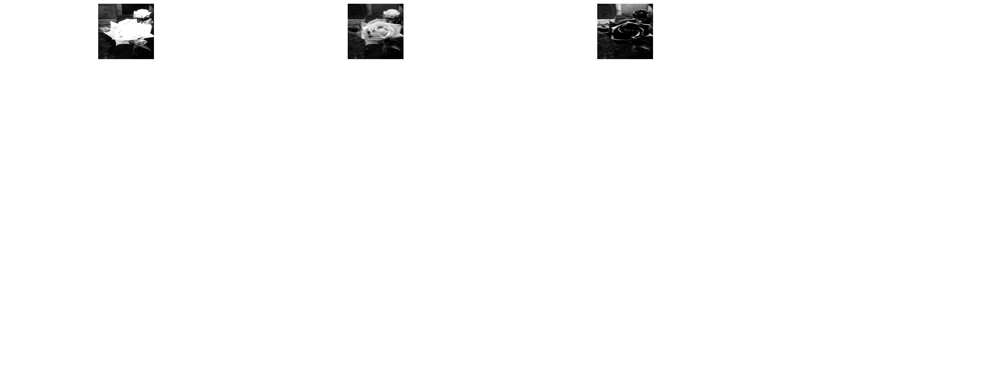

In [66]:
display_activation(activations, 4, 6, 1)

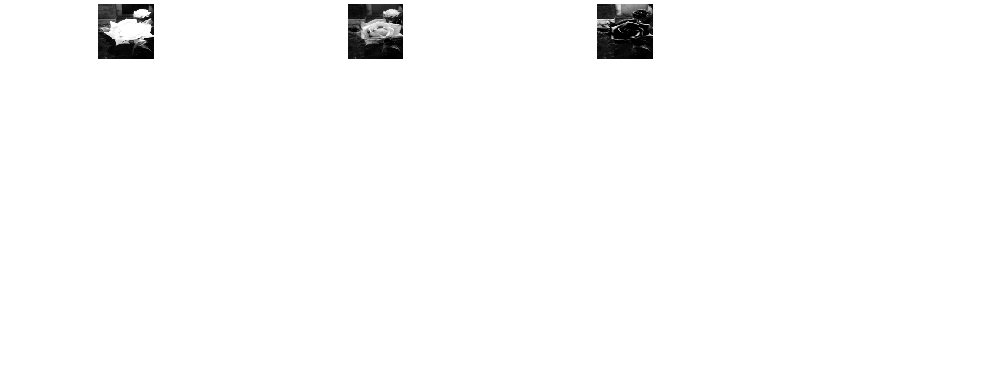

In [67]:
display_activation(activations, 4, 6, 3)

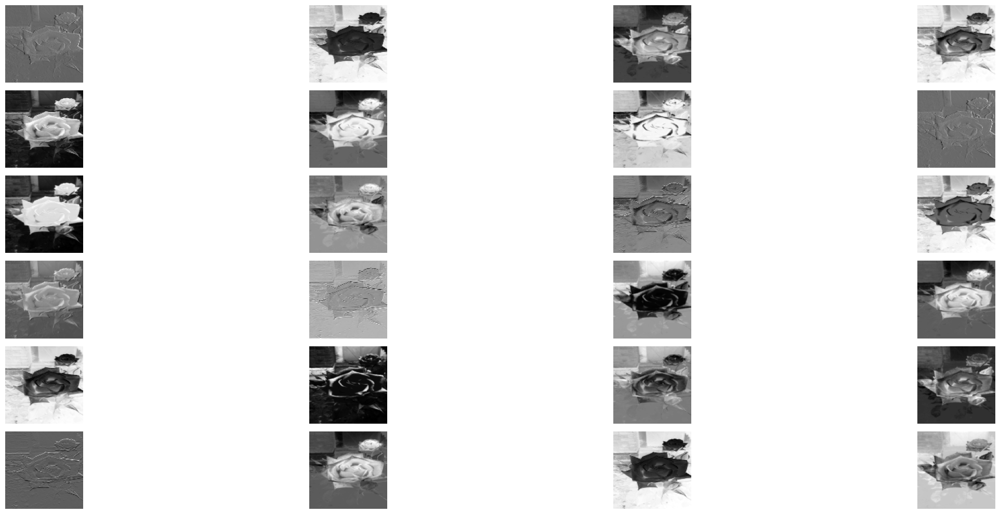

In [68]:
display_activation(activations, 4, 6, 5)

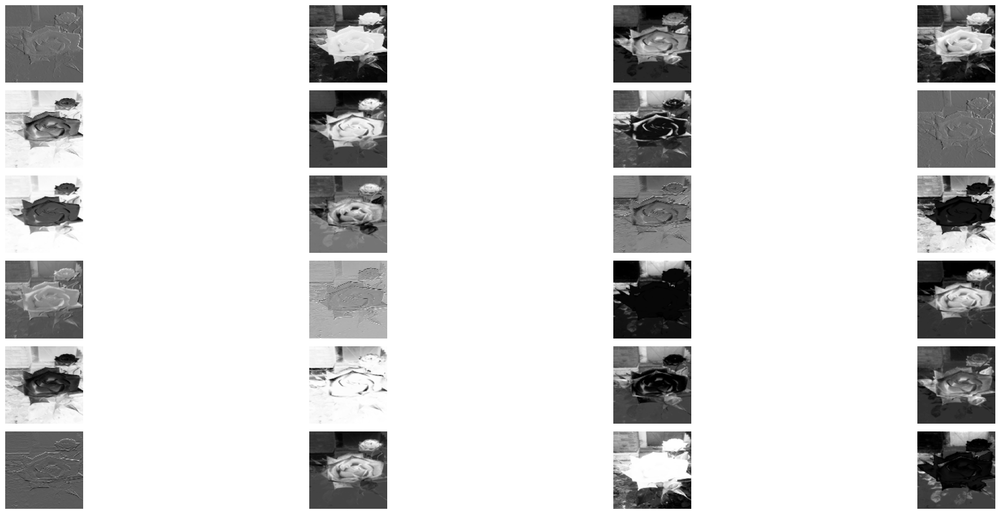

In [69]:
display_activation(activations, 4, 6, 6)